# Importing all the libraries needed to process the images before the training

In [1]:
from IPython.utils import io
%matplotlib inline
import matplotlib.pyplot as plt

from matplotlib.pyplot import figure

import cv2
import numpy as np
from skimage import exposure
from skimage import morphology
from skimage import segmentation

from scipy import ndimage

from copy import deepcopy
from os import listdir
from os.path import isfile, join

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import os
import errno

from IPython.display import clear_output

# Personal Library for image processing
### This library has all the functions I will use to transform each image 

In [2]:
import imagepro 

<Figure size 720x720 with 0 Axes>

In [3]:
sample = 1

In [4]:
def create_folder(filename):
    if not os.path.exists(os.path.dirname(filename)):
        try:
            os.makedirs(os.path.dirname(filename))
        except OSError as exc: # Guard against race condition
            if exc.errno != errno.EEXIST:
                raise


# Image Processing



In [5]:
def nonameBig(file, plotVisible=True):
    # Input data
    imgGray= file
    imgGray= imagepro.cut_edges(imgGray)
    imgGray= imagepro.cut_borders(imgGray)
    imagepro.plotX(2,file,'Original',imgGray,'Cropped Image',plotVisible=True)
        
    return imgGray

# Cutting edges and Cropping middle section 
## Images have white edges since they are scanned OCT images

In [6]:
source= 'DATA'
types= {'train','test','val'}
directory = {'CNV','NORMAL','DRUSEN','DME'}
outputFolder= 'DATAR'


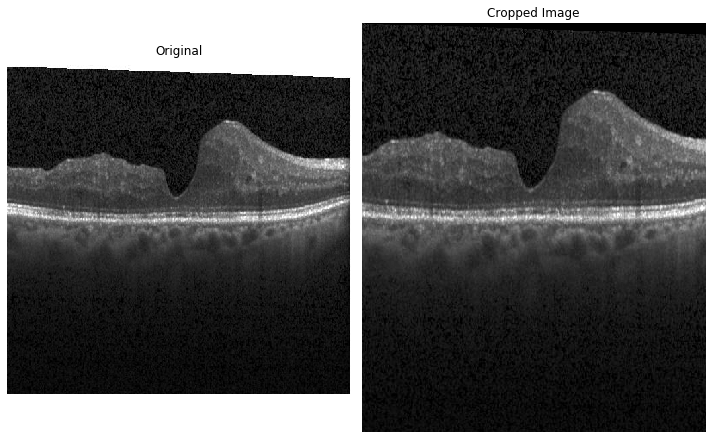

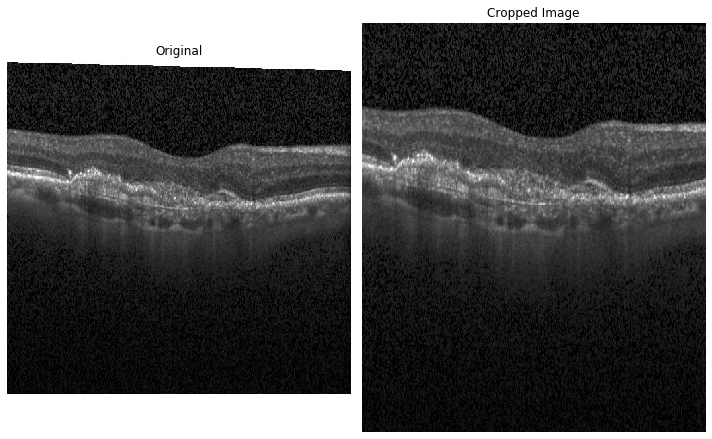

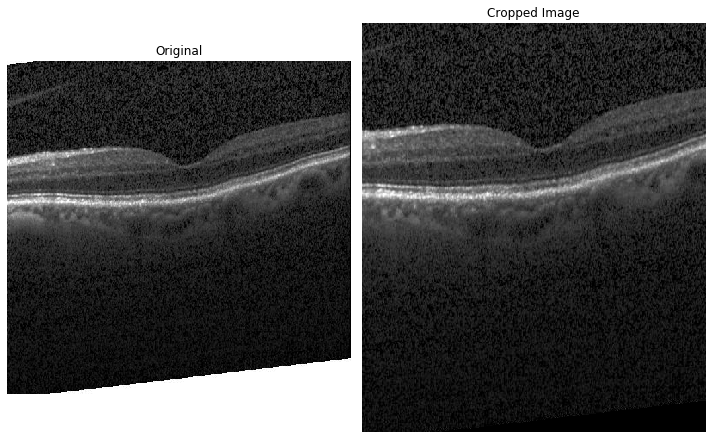

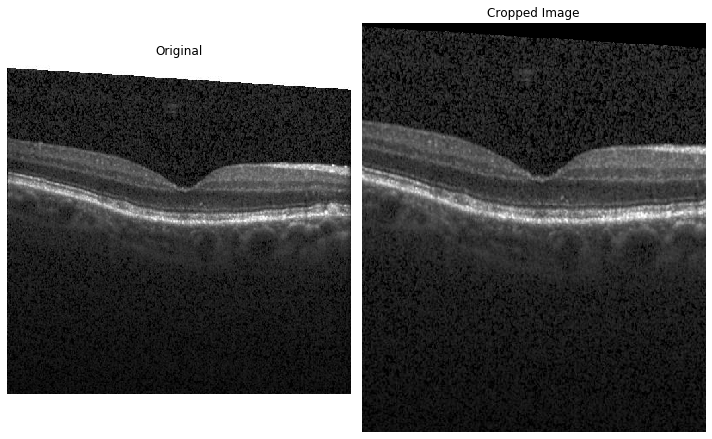

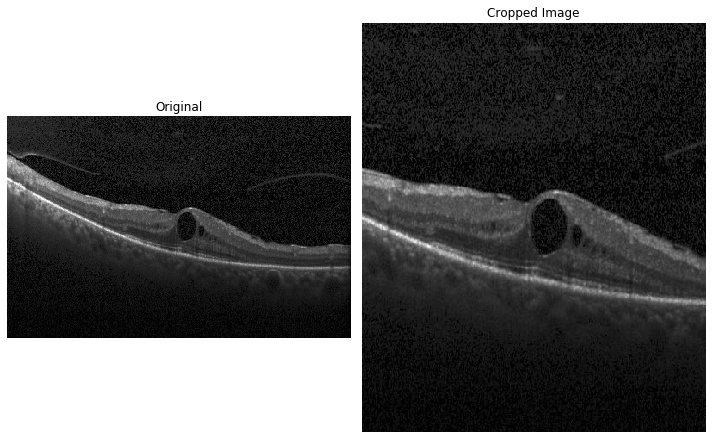

...

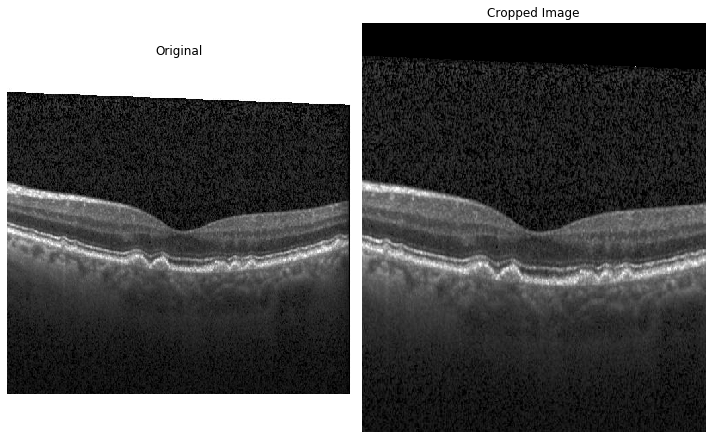

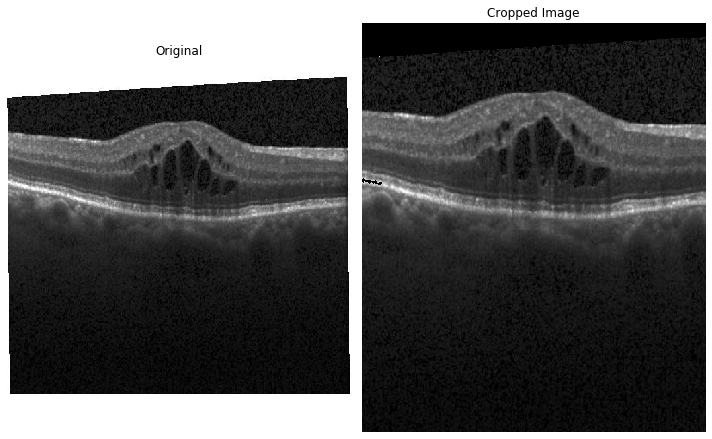

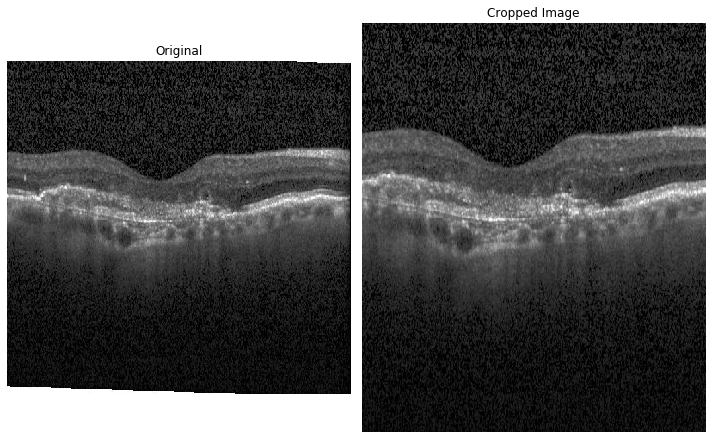

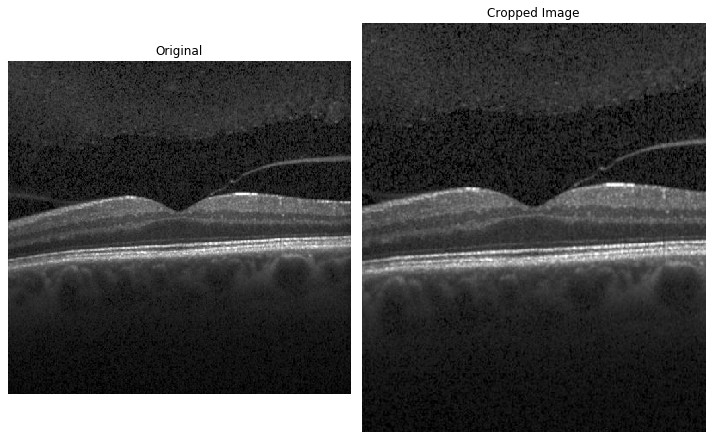

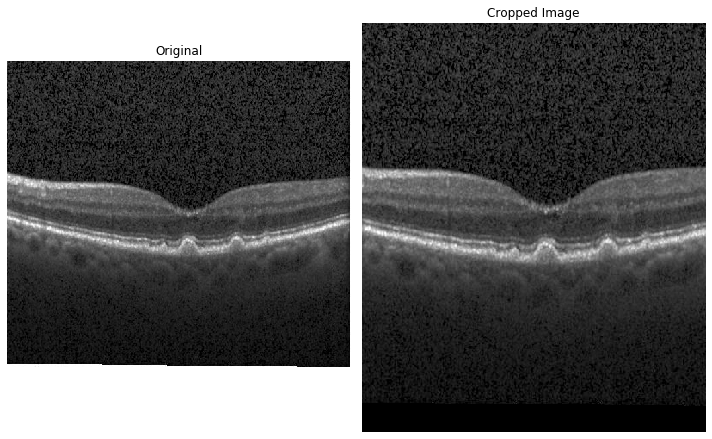

In [7]:
for type in types:
    for subFolder in directory:
        path= (source+'/'+type+'/'+subFolder)
        onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
        if sample>=1 : onlyfiles = onlyfiles[:sample]
        for i, file in enumerate(onlyfiles):
            file_=[]
            filename_=(path+'/'+file)
            file_ = cv2.imread(filename_, cv2.IMREAD_GRAYSCALE)
            
            filename = (outputFolder+'/'+type+'/'+subFolder+'/'+file)
            if file_.shape[1]>0:
                f = nonameBig(file_, plotVisible=True)

                create_folder(filename)
                cv2.imwrite(filename,f)
                print("{0:.3f}".format(i/len(onlyfiles)*100),'% - File:',i+1,'of:',len(onlyfiles),
                      '- Filename: ' ,filename_,'     ',end='\r')



# Attempt to resize files before being processed

In [8]:
source= 'DATAR'
types= {'train','test','val'}
directory = {'CNV','NORMAL','DRUSEN','DME'}
outputFolder= 'DATAS'


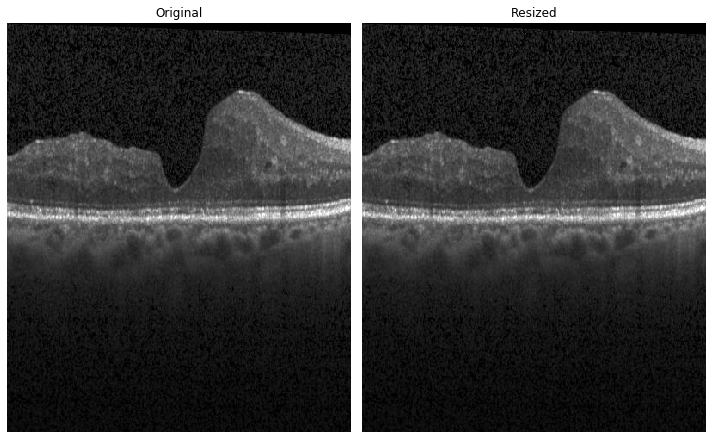

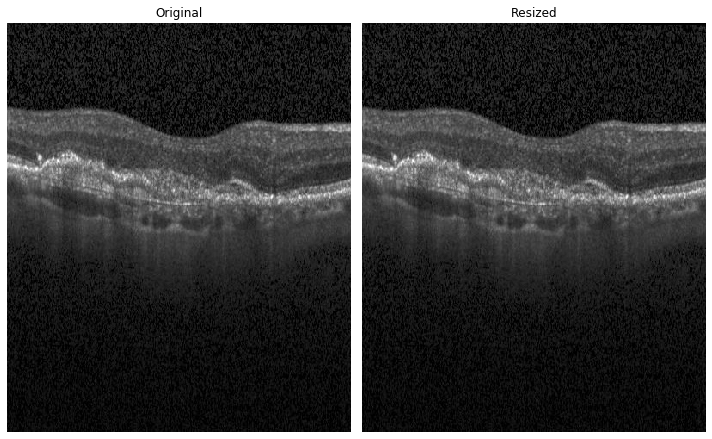

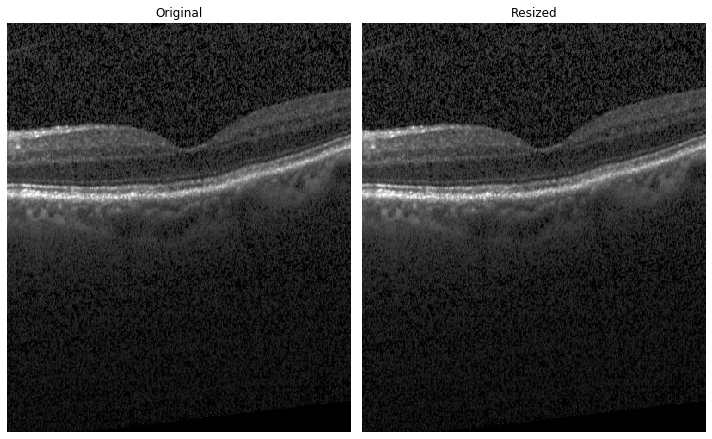

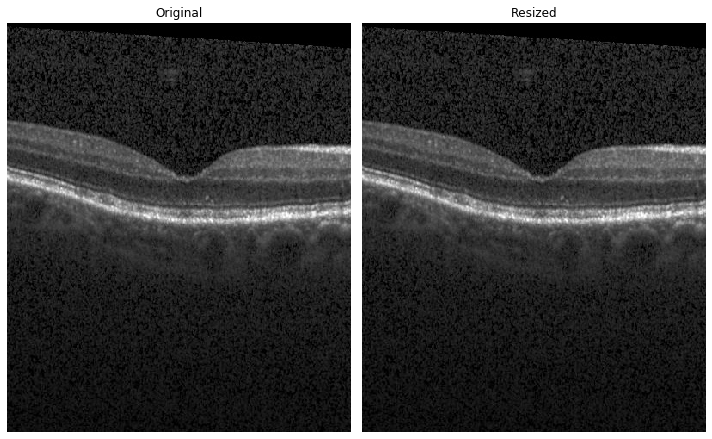

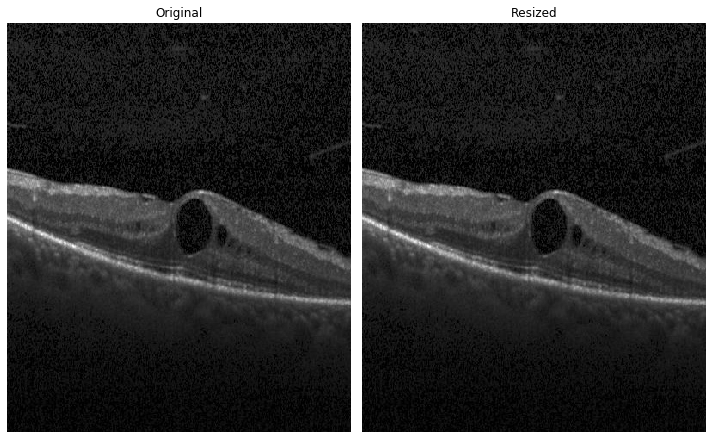

...

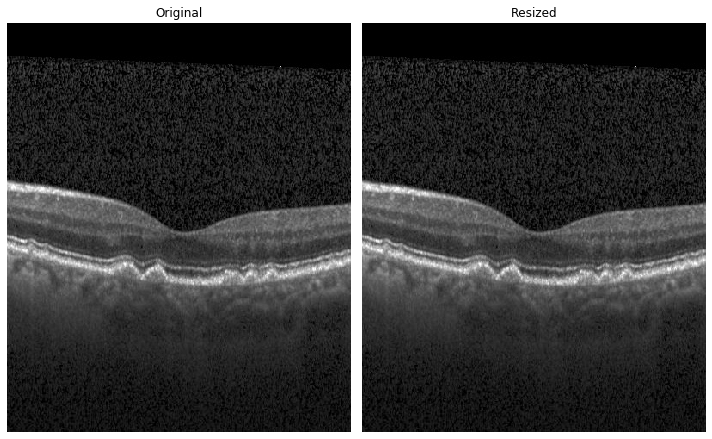

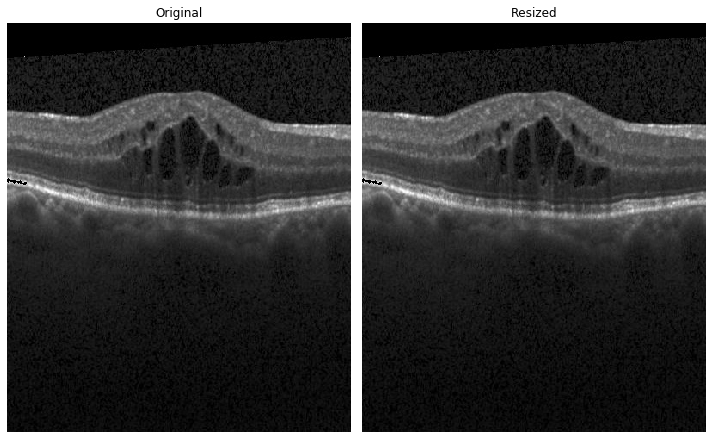

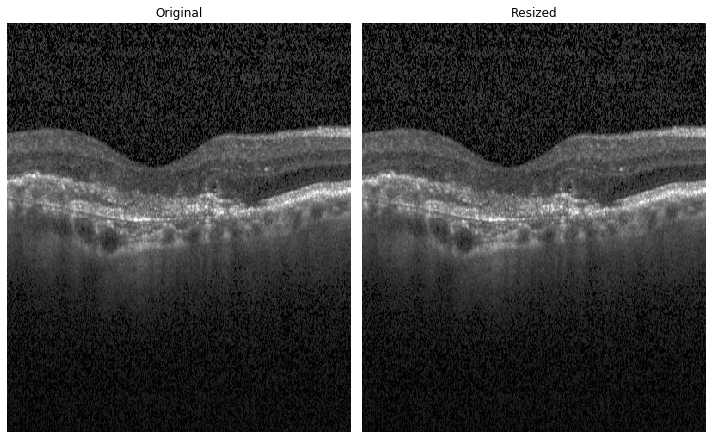

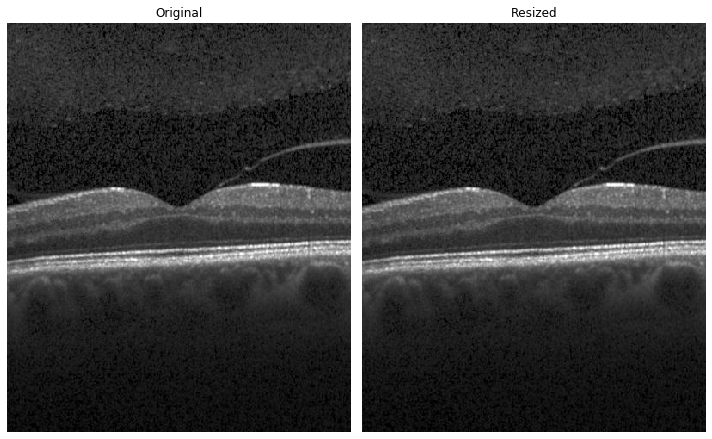

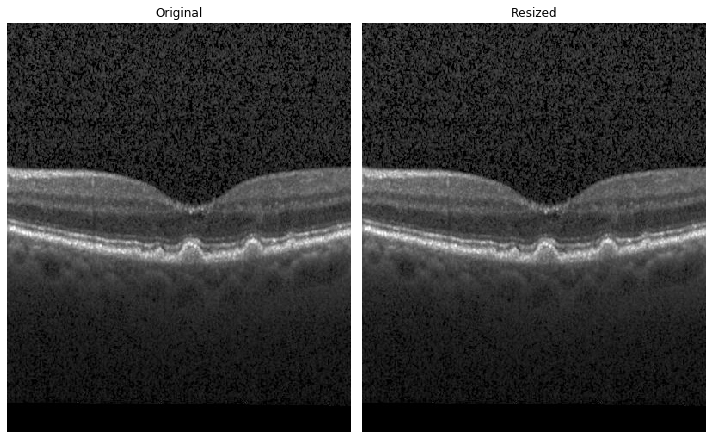

In [9]:
for type in types:
    for subFolder in directory:
        path= (source+'/'+type+'/'+subFolder)
        onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
        if sample>=1 : onlyfiles = onlyfiles[:sample]
        for i, file in enumerate(onlyfiles):
            #if i%100==0: clear_output()
            file_=[]
            filename_=(path+'/'+file)
            file_ = cv2.imread(filename_, cv2.IMREAD_GRAYSCALE)
            f = imagepro.resize_(file_)
            filename = (outputFolder+'/'+type+'/'+subFolder+'/'+file)

            create_folder(filename)
            cv2.imwrite(filename,f) 
            print("{0:.3f}".format(i/len(onlyfiles)*100),'% - File:',i+1,'of:',len(onlyfiles),
                  '- Filename: ' ,filename_,'     ',end='\r')
            imagepro.plotX(2,file_,"Original",f,"Resized")

# Final image processing.
## Using images from past stage.

In [10]:
def nonameNEW(file, br_=35, c_=30, ext = -1, mid = 9, plotVisible=True, init_ = 1):
    # Input data
    
      
    img = file.copy()
    
    morph_kernel3 = np.array([[ext,ext,ext],
                            [  ext,mid,ext],
                            [  ext,ext,ext]])
    
    scale_percent = 50 # percent of original size
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
    imgBlurred = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    
    imgDenoised= cv2.fastNlMeansDenoising(imgBlurred, None, 15, 5) 

    imgFiltered = cv2.filter2D(imgDenoised, -1, morph_kernel3)

    imgBC = imagepro.apply_brightness_contrast(imgFiltered, br_,c_)

    imagepro.plotX(4,file,"Original",imgDenoised,"Denoised",imgFiltered,"Filtered",imgBC,"Brightness/Contrast",plotVisible=True)

    return imgBC

In [11]:
source= 'DATAS'
types= {'train','test','val'}
directory = {'CNV','NORMAL','DRUSEN','DME'}
outputFolder= 'DATAT'


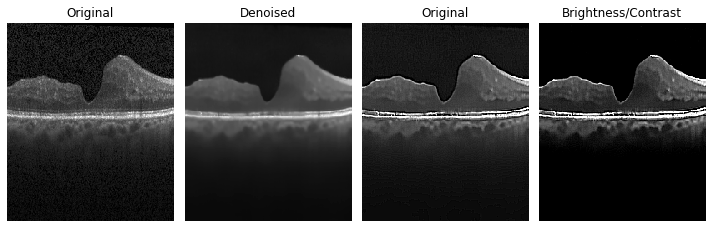

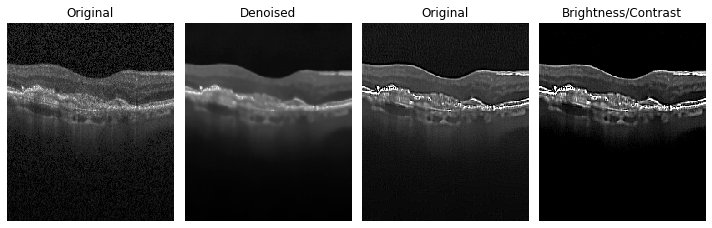

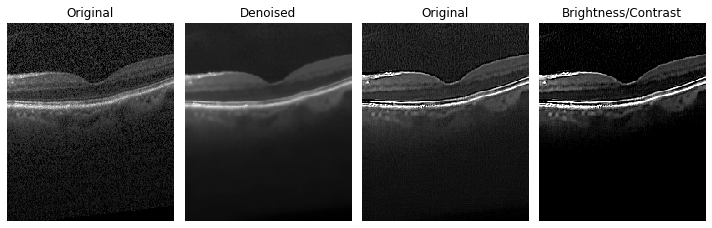

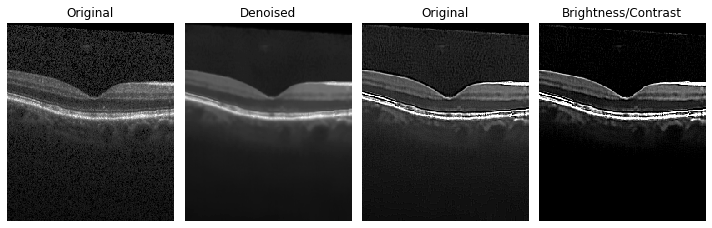

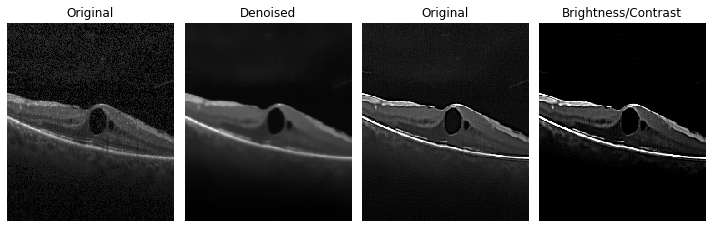

...

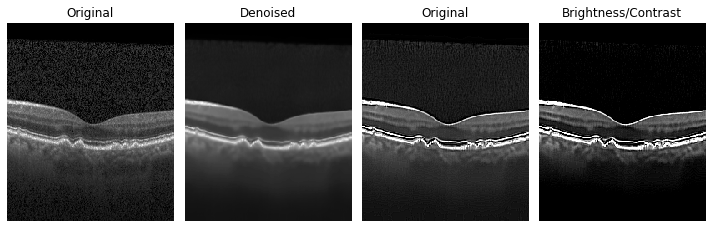

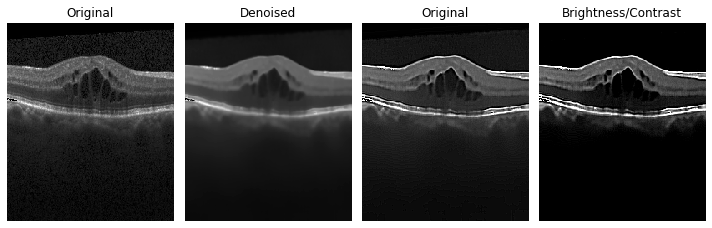

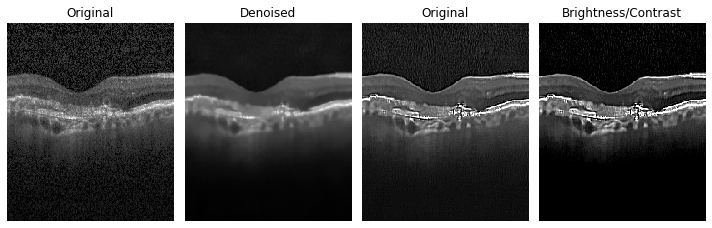

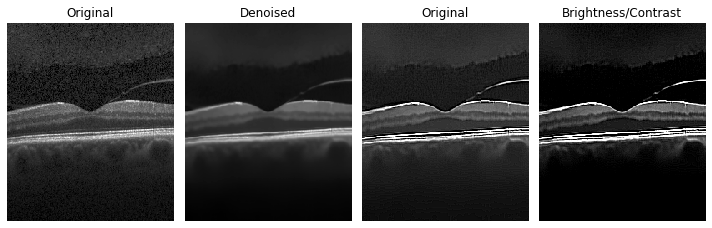

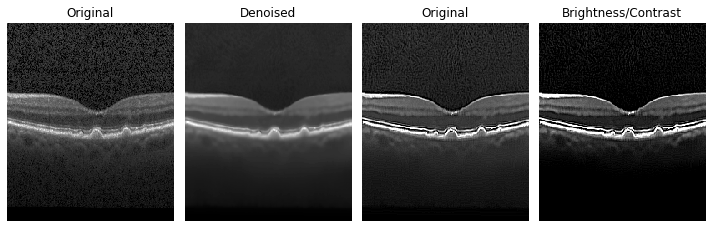

In [12]:
for type in types:
    for subFolder in directory:
        path= (source+'/'+type+'/'+subFolder)
        sample = 8
        onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
        if sample>=1 : onlyfiles = onlyfiles[:sample]
        for i, file in enumerate(onlyfiles):
            
            print("{0:.3f}".format(i/len(onlyfiles)*100),'% - File:',i+1,'of:',len(onlyfiles),
                  '- File:' ,filename_,'     ',end='\r')
            if (i+1)%100==0: clear_output()
            file_=[]
            filename_=(path+'/'+file)
            file_ = cv2.imread(filename_, cv2.IMREAD_GRAYSCALE)
            
            filename = (outputFolder+'/'+type+'/'+subFolder+'/'+file)
            if file_.shape[1]>0:
                p = nonameNEW(file_, br_=10, c_=25,
                              ext = -1, mid = 9, plotVisible=True, init_=0)

                if i== 0: create_folder(filename)
                
            cv2.imwrite(filename,p) 
#                 plot_(p,'OUT - ',1);

# Aplying OTSU Thresholding to resulting images
## OTSU images are easier to compute while training a DNN

In [13]:
source= 'DATAT'
types= {'train','test','val'}
directory = {'CNV','NORMAL','DRUSEN','DME'}
outputFolder= 'DATAU'


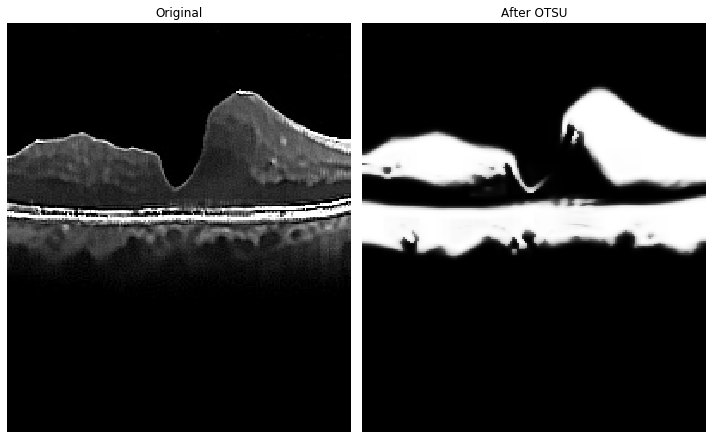

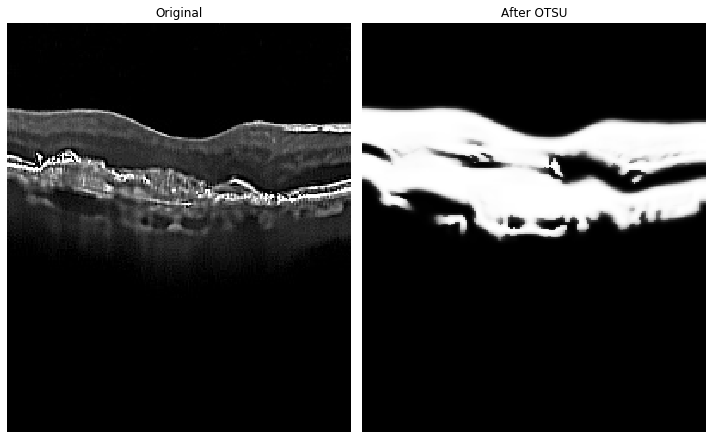

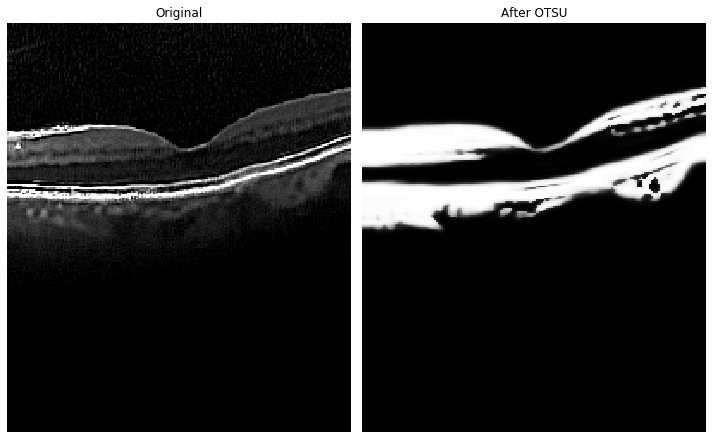

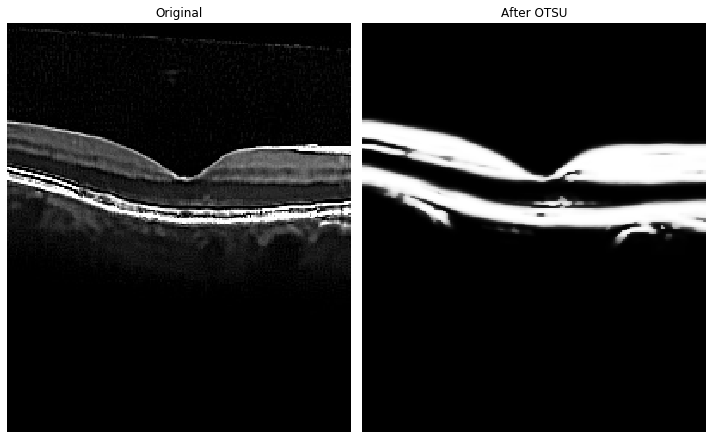

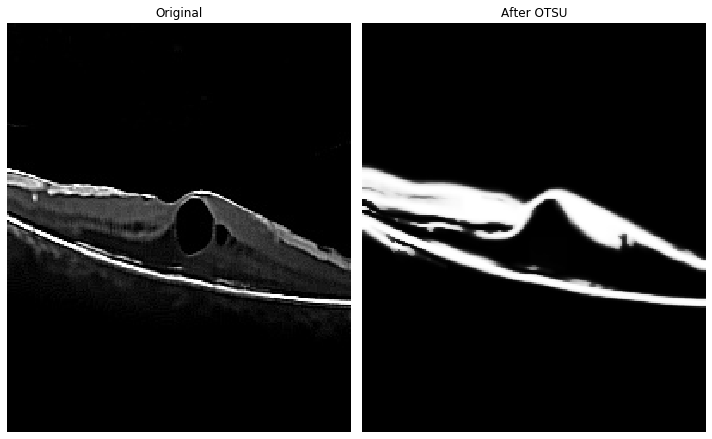

...

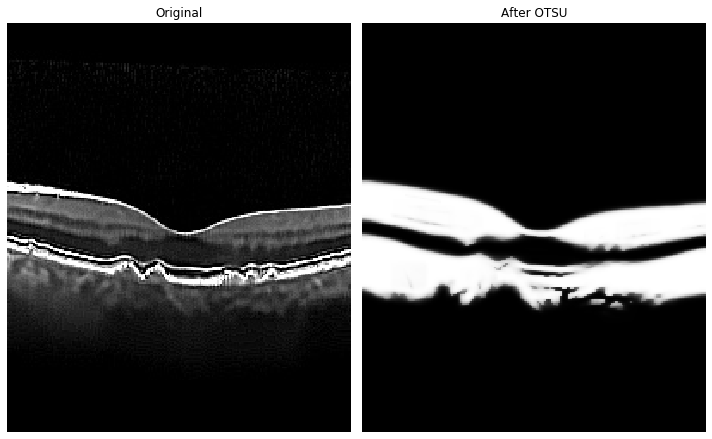

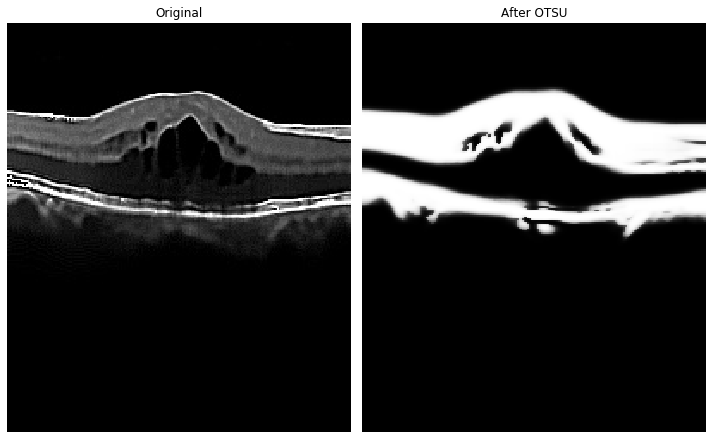

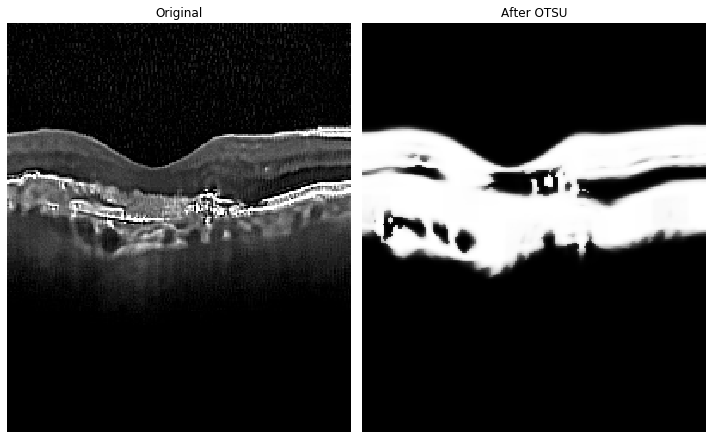

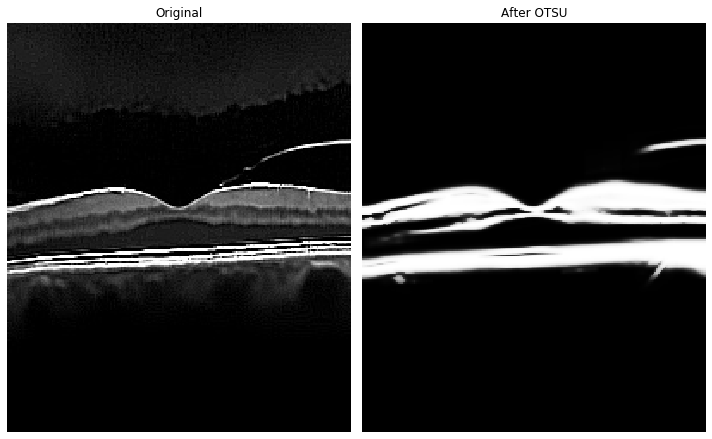

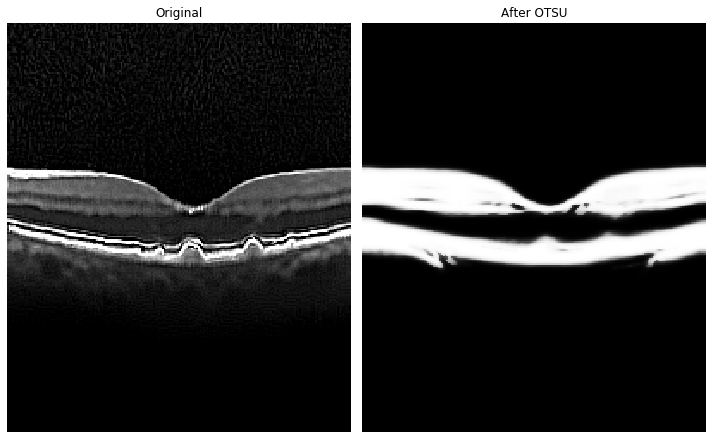

In [14]:
for type in types:
    for subFolder in directory:
        path= (source+'/'+type+'/'+subFolder)
        sample = 8
        onlyfiles = [f for f in listdir(path) if isfile(join(path, f))]
        if sample>=1 : onlyfiles = onlyfiles[:sample]
        for i, file in enumerate(onlyfiles):
            
            
            print("{0:.3f}".format(i/len(onlyfiles)*100),'% - File:',i+1,'of:',len(onlyfiles),
                  '- File:' ,filename_,'     ',end='\r')
            if (i+1)%100==0: clear_output()
            img=[]
            filename_=(path+'/'+file)
            img = cv2.imread(filename_, cv2.IMREAD_GRAYSCALE)
            
            blur = cv2.GaussianBlur(img,(5,5),0)
            ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
            th3= cv2.fastNlMeansDenoising(th3, None, 55, 15) 
            
            filename = (outputFolder+'/'+type+'/'+subFolder+'/'+file)
            if i== 0: create_folder(filename)
            cv2.imwrite(filename,th3)
            imagepro.plotX(2,img,'Original',th3,'After OTSU')
            
            